### Functions

In [1]:
def load_session_data(subject, date):
    """Load all data for a given subject and date"""
    import sys
    sys.path.append(r'D:\Neural-Pipeline\source')
    from analysis_utils.NeuralDataLoader import NeuralDataLoader, Dots3DMPConfig
    
    # Load session
    loader = NeuralDataLoader()
    loader.load_session(subject, date)
    config = Dots3DMPConfig(subject)

    # spike data (unit, trial, time)
    stimOn_spikes = loader.get_spike_data(alignment='stimOn', good_units_only=True, good_trials_only=True)
    saccOnset_spikes = loader.get_spike_data(alignment='saccOnset', good_units_only=True, good_trials_only=True)
    postTargHold_spikes = loader.get_spike_data(alignment='postTargHold', good_units_only=True, good_trials_only=True)
    tuning_spikes = loader.get_tuning_data(good_units_only=True, good_trials_only=True)

    # behavioral data
    behavior_dots3DMP = loader.get_behavioral_data(task='dots3DMP', good_trials_only=True)
    behavior_tuning = loader.get_behavioral_data(task='tuning', good_trials_only=True)
    behavior_converted = config.convert_behavioral_data(behavior_dots3DMP, task='dots3DMP')
    behavior_tuning_converted = config.convert_behavioral_data(behavior_tuning, task='tuning')

    # Unit Info
    unit_info = loader.get_unit_info(good_units_only=True)
    MST_units = loader.get_units_by_area(unit_info, area_name='MST')
    VPS_units = loader.get_units_by_area(unit_info, area_name='VPS')
    dual_units = loader.get_units_by_area(unit_info, area_name='dual')

    # Time Info
    time_info = config.get_time_Info('dots3DMP')
    time_info_tuning = config.get_time_Info('tuning')
    time_axes_dots3DMP = config.get_time_axes('dots3DMP')

    # Prepare data
    spikes_data = {
        'stimOn': stimOn_spikes,
        'saccOnset': saccOnset_spikes,
        'postTargHold': postTargHold_spikes
    }
    
    units_data = {
        'MST': MST_units,
        'VPS': VPS_units,
        'dual': dual_units
    }
    
    return {
        'loader': loader,
        'config': config,
        'spikes_data': spikes_data,
        'behavior_converted': behavior_converted,
        'behavior_tuning_converted': behavior_tuning_converted,
        'unit_info': unit_info,
        'units_data': units_data,
        'time_axes_dots3DMP': time_axes_dots3DMP,
        'time_info': time_info,
        'time_info_tuning': time_info_tuning
    }

In [2]:
def run_hyperparameter_search(subject, date, data_dict):
    """Run hyperparameter search for all areas and targets"""
    from analysis_population.PopulationDecoder import Defineparameters
    import numpy as np
    
    # Initialize decoder
    decoder = Defineparameters(subject, date)
    
    # Define areas to test and decode targets
    areas = ['dual', 'MST', 'VPS']
    decode_targets = ['choice', 'stimulus', 'PDW']
    
    balance_info = decoder.check_unit_balance(
        data_dict['units_data']['dual'], 
        data_dict['units_data']['MST'], 
        data_dict['units_data']['VPS']
    )
    
    # Store all results
    all_results = {}
    
    # Loop through areas
    for area in areas:
        print(f"\n{'='*50}")
        print(f"PROCESSING AREA: {area}")
        print(f"{'='*50}")
        
        # Get valid units for this area
        valid_units = data_dict['units_data'][area]
        print(f" Number of valid units in {area}: {valid_units.shape[0]}")
        
        # Store results for this area
        all_results[area] = {}
        balance_info_area = balance_info[area]
        
        # Loop through decode targets
        for target in decode_targets:
            print(f"\nDecoding {target} for {area}...")
            
            try:
                result = decoder.run_decoding_analysis(
                    target, 
                    data_dict['spikes_data'], 
                    data_dict['behavior_converted'], 
                    data_dict['time_axes_dots3DMP'], 
                    balance_info_area,
                    valid_units
                )
                all_results[area][target] = result
                
            except Exception as e:
                print(f"Error decoding {target} for {area}: {e}")
                all_results[area][target] = None
    
    # Print summary
    print(f"\n{'='*60}")
    print("SUMMARY OF ALL RESULTS")
    print(f"{'='*60}")
    
    for area in areas:
        print(f"\n{area.upper()}:")
        for target in decode_targets:
            result = all_results[area][target]
            if result is not None:
                accuracy = result['best_score']
                n_neurons = result['n_neurons']
                n_trials = result['n_trials']
                print(f"  {target:8}: {accuracy:.3f} ({n_neurons:3d} neurons, {n_trials:3d} trials)")
            else:
                print(f"  {target:8}: Failed")
    
    # Save the combined results dictionary
    combined_filename = f"{subject}_{date}_all_areas_all_targets_combined.npy"
    combined_filepath = decoder.save_dir / combined_filename
    np.save(combined_filepath, all_results, allow_pickle=True)
    print(f"\nCombined results saved to: {combined_filename}")
    
    return all_results

In [3]:
def run_sliding_window_decoding(subject, date, data_dict):
    """Run sliding window decoding analysis"""
    from analysis_population.PopulationDecoder import SlidingWindowDecoder
    
    areas = ['dual', 'MST', 'VPS']
    decode_targets = ['choice', 'stimulus', 'PDW']
    
    # Run decoding analysis
    for area in areas:
        print(f"\n=== Processing area: {area} ===")
        
        valid_units = data_dict['units_data'][area]
        
        for target in decode_targets:
            print(f"\n--- Processing target: {target} ---")
            
            # Create decoder instance
            decoder = SlidingWindowDecoder(subject, date)
            decoder.setup_decoder(brain_area=area, decode_target=target)
            
            for mod in [1, 2, 3]:
                for coh in [1, 2]:
                    if mod == 1 and coh == 2:
                        continue  

                    results = decoder.run_decoding_analysis_cv(
                        spikes_data=data_dict['spikes_data'],
                        behavior_data=data_dict['behavior_converted'],
                        time_axes=data_dict['time_axes_dots3DMP'],
                        area=area,
                        target=target, 
                        train_mod=mod, 
                        train_coh=coh,    
                        test_mod=mod, 
                        test_coh=coh,
                        valid_units=valid_units,
                        save_results=True
                    )
    
    print(f"Completed sliding window decoding for {subject} {date}")

In [4]:
def process_all_dates(subject, dates, run_hyperparams=True, run_sliding_window=True):
    """Process all dates with optional hyperparameter search and sliding window decoding"""
    
    all_hyperparams_results = {}
    
    for date in dates:
        print(f"\n{'#'*80}")
        print(f"PROCESSING DATE: {date}")
        print(f"{'#'*80}")
        
        try:
            # Step 1: Load data
            print("Loading session data...")
            data_dict = load_session_data(subject, date)
            
            # Step 2: Run hyperparameter search (optional)
            if run_hyperparams:
                print("Running hyperparameter search...")
                hyperparams_results = run_hyperparameter_search(subject, date, data_dict)
                all_hyperparams_results[date] = hyperparams_results
            
            # Step 3: Run sliding window decoding (optional)
            if run_sliding_window:
                print("Running sliding window decoding...")
                run_sliding_window_decoding(subject, date, data_dict)
                
        except Exception as e:
            print(f"Error processing date {date}: {e}")
            continue
    
    return all_hyperparams_results

### Main code, run here

In [5]:
subject = "zarya"
dates = ["20250602", "20250702", "20250710", "20250523"]

# Run both hyperparameter search and sliding window decoding
results = process_all_dates(subject, dates, run_hyperparams=False, run_sliding_window=True)


################################################################################
PROCESSING DATE: 20250602
################################################################################
Loading session data...
Loaded dots3DMP data: zarya20250602dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250602dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
Running sliding window decoding...

=== Processing area: dual ===

--- Processing target: choice ---
Decoding choice in dual
Condition: train_mod1_coh1_test_mod1_coh1 (same-condition)

  Processing alignment: stimOn
Pre-processing data...
    No balancing applied (not PDW target)
    Final dataset: 84 trials
Results saved to: D:\Neural-Pipeline\results\analysis_population\decoders\zarya_20250602_dual_choice_stimOn_train_mod1_coh1_test_mod1_coh1_cv_results.npy

  Processing alignment: saccOnset
Pre-processing data...
    No balancing applied (not PDW target)
    Final dataset: 84 trials
Results saved to:

### plot results by modality and coherence, Prob and AUC

Loaded dots3DMP data: zarya20250602dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250602dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya

############################################################
PROCESSING TARGET: CHOICE - BY MODALITY/COHERENCE
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: Loaded session data successfully
    20250602: loaded 460 trials
Loaded dots3DMP data: zarya20250702dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250702dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
    20250702: Loaded session data successfully
    20250702: loaded 460 trials
Loaded dots3DMP data: zarya20250710dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250710dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
    20250710: Loaded session data successfully

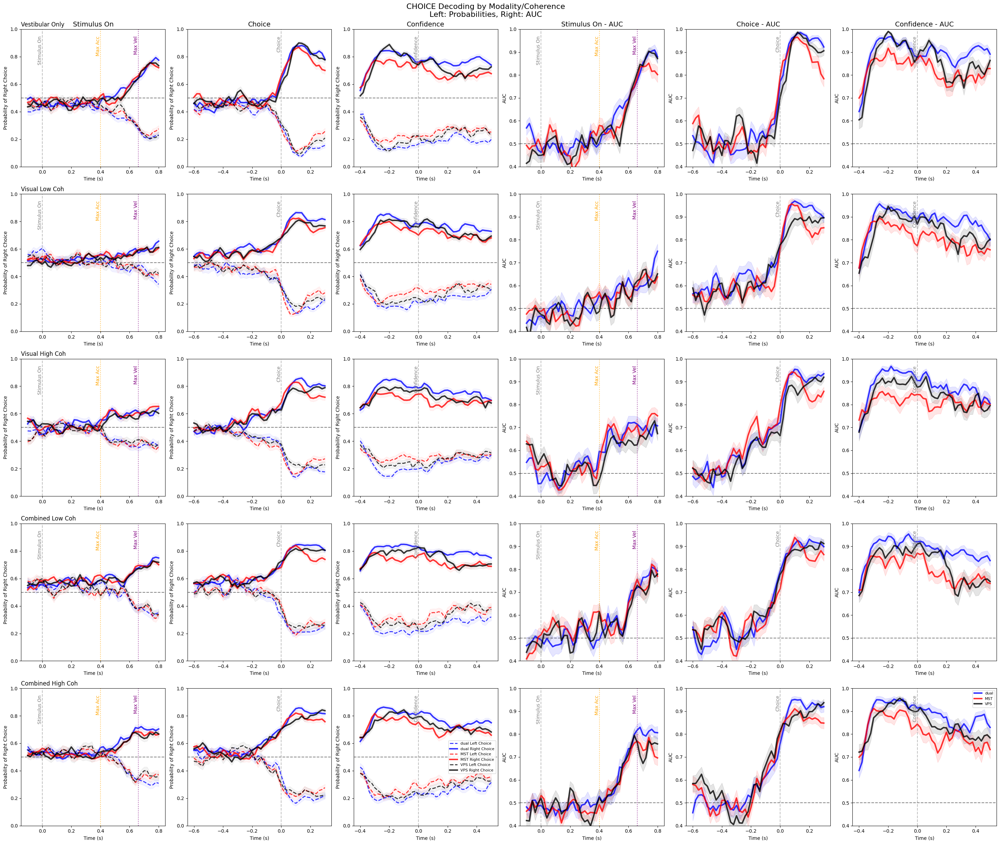


############################################################
PROCESSING TARGET: STIMULUS - BY MODALITY/COHERENCE
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: Loaded session data successfully
    20250602: loaded 460 trials
Loaded dots3DMP data: zarya20250702dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250702dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
    20250702: Loaded session data successfully
    20250702: loaded 460 trials
Loaded dots3DMP data: zarya20250710dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250710dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
    20250710: Loaded session data successfully
    20250710: loaded 460 trials
Loaded dots3DMP data: zarya20250523dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250523dots3DMPtuning_processed.npz
Loaded dots3DM

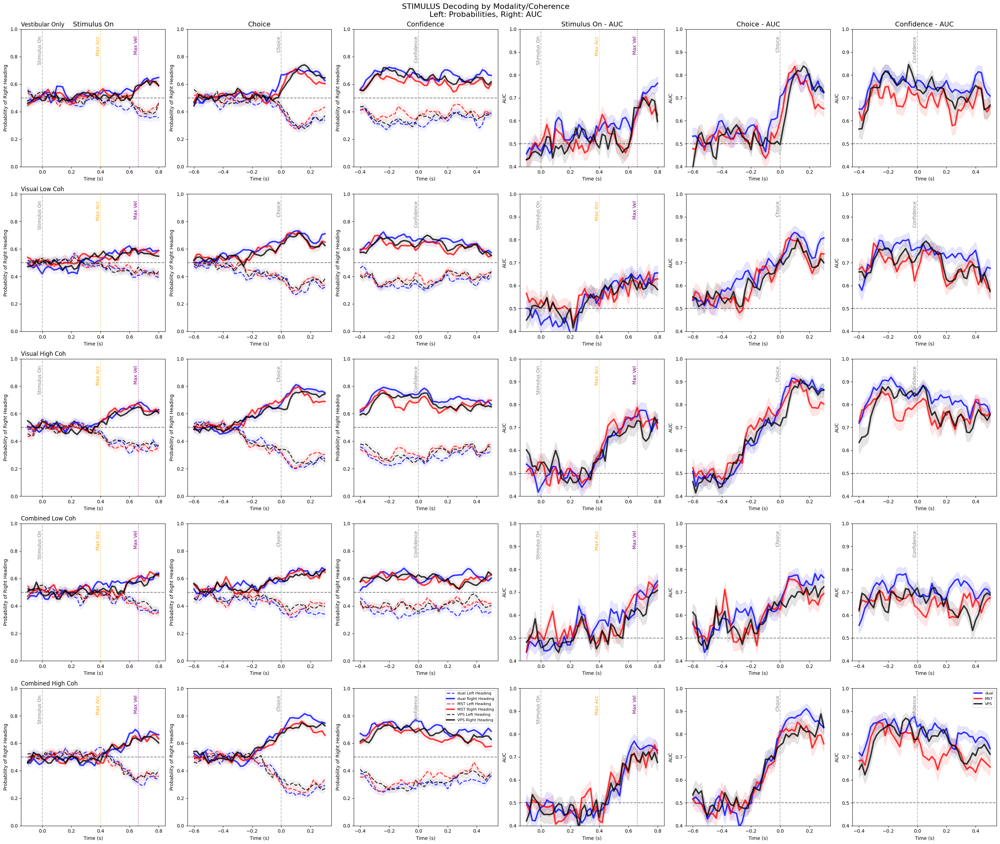


############################################################
PROCESSING TARGET: PDW - BY MODALITY/COHERENCE
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: Loaded session data successfully
    20250602: loaded 460 trials
Loaded dots3DMP data: zarya20250702dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250702dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
    20250702: Loaded session data successfully
    20250702: loaded 460 trials
Loaded dots3DMP data: zarya20250710dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250710dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya
    20250710: Loaded session data successfully
    20250710: loaded 460 trials
Loaded dots3DMP data: zarya20250523dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250523dots3DMPtuning_processed.npz
Loaded dots3DMP con

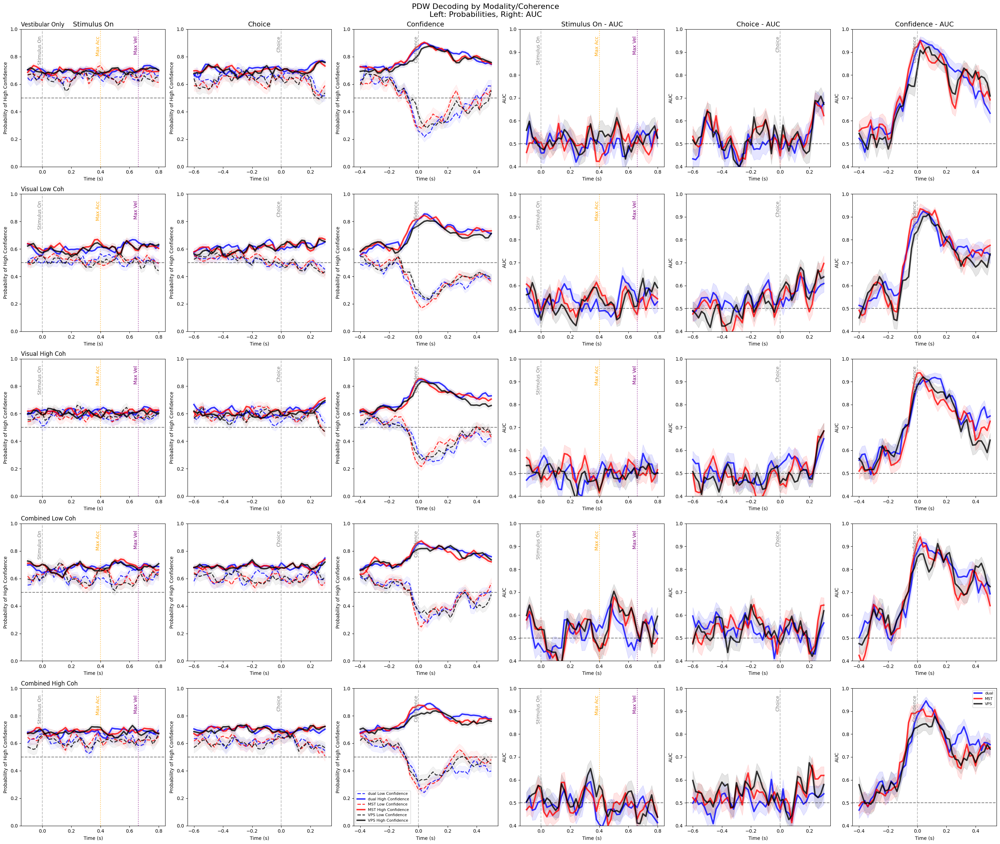

In [23]:
from matplotlib import pyplot as plt
import numpy as np


# Load session data once outside the loop (since it's the same across sessions)
subject = "zarya"
date = "20250602"  # Reference date for loading behavioral structure
data_dict = load_session_data(subject, date)

# Define brain areas, alignments, and targets
areas = ['dual', 'MST', 'VPS']
alignments = ['stimOn', 'saccOnset', 'postTargHold']
targets = ['choice', 'stimulus', 'PDW']
area_colors = {'dual': 'blue', 'MST': 'red', 'VPS': 'black'}

# Alignment display names
alignment_names = {
    'stimOn': 'Stimulus On',
    'saccOnset': 'Choice', 
    'postTargHold': 'Confidence'
}

# Define modality/coherence conditions with their file parameters
modality_conditions = {
    'Vestibular Only': {'mod': 1, 'coh': 1},        # Row 0: mod1_coh1
    'Visual Low Coh': {'mod': 2, 'coh': 1},         # Row 1: mod2_coh1
    'Visual High Coh': {'mod': 2, 'coh': 2},        # Row 2: mod2_coh2
    'Combined Low Coh': {'mod': 3, 'coh': 1},       # Row 3: mod3_coh1
    'Combined High Coh': {'mod': 3, 'coh': 2}       # Row 4: mod3_coh2
}

# Velocity profile markers for stimOn alignment
vel_markers = {
    'max_velocity': 0.66,
    'max_acceleration': 0.4,
}
dates = ["20250602", "20250702", "20250710", "20250523"]   

# Function to create file path based on modality/coherence condition
def get_filepath(date, area, alignment, target, mod, coh):
    return f"D:\\Neural-Pipeline\\results\\analysis_population\\decoders\\zarya_{date}_{area}_{target}_{alignment}_train_mod{mod}_coh{coh}_test_mod{mod}_coh{coh}_cv_results.npy"

# Process each target separately
for target in targets:
    print(f"\n{'#'*60}")
    print(f"PROCESSING TARGET: {target.upper()} - BY MODALITY/COHERENCE")
    print(f"{'#'*60}")
    
    # Create figure with subplots (5 rows x 6 columns: 5 conditions x (3 prob + 3 AUC))
    fig, axes = plt.subplots(5, 6, figsize=(30, 25))
    
    all_stats = {}
    
    for j, alignment in enumerate(alignments):
        print(f"\n{'='*20} {alignment.upper()} {'='*20}")
        
        alignment_stats = {}
        
        # Initialize time_axes
        time_axes = None
        
        for area in areas:
            color = area_colors[area]
            
            print(f"\n{area}:")
            
            # Process each modality/coherence condition (each row)
            for i, (condition_name, condition_params) in enumerate(modality_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Collect trials from all dates for this specific condition
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    # Get time axes for this alignment (from loaded session data)
                    try:
                        if date == "20250602":  # Use pre-loaded data for reference date
                            time_axes_dots3DMP = data_dict['time_axes_dots3DMP']
                        else:
                            # Load data for other dates
                            date_data_dict = load_session_data(subject, date)
                            time_axes_dots3DMP = date_data_dict['time_axes_dots3DMP']
                        
                        if time_axes is None:
                            time_axes = time_axes_dots3DMP[alignment]
                        
                        print(f"    {date}: Loaded session data successfully")
                    except Exception as e:
                        print(f"    {date}: Failed to load session data - {str(e)}")
                        continue
                    
                    # Get the correct filepath for this condition
                    filepath = get_filepath(date, area, alignment, target, mod, coh)
                    
                    try:
                        # Load results
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        
                        # Add all trials to the pool
                        all_trials.extend(trial_results)
                        
                        successful_dates += 1
                        print(f"    {date}: loaded {len(trial_results)} trials")
                        
                    except FileNotFoundError:
                        print(f"    {date}: File not found - {filepath}")
                        continue
                    except Exception as e:
                        print(f"    {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"    No data found for {area} {condition_name}")
                    continue
                
                print(f"    Total trials: {len(all_trials)} from {successful_dates} dates")
                
                # Set target-specific labels
                if target == 'choice':
                    class_0_label = f'{area} Left Choice'
                    class_1_label = f'{area} Right Choice'
                    ylabel = 'Probability of Right Choice'
                elif target == 'stimulus':
                    class_0_label = f'{area} Left Heading'
                    class_1_label = f'{area} Right Heading'
                    ylabel = 'Probability of Right Heading'
                elif target == 'PDW':
                    class_0_label = f'{area} Low Confidence'
                    class_1_label = f'{area} High Confidence'
                    ylabel = 'Probability of High Confidence'
                
                # Process trials for this condition
                if all_trials:
                    time_points = sorted(list(set([trial['time'] for trial in all_trials])))
                    
                    class_0_proba = []
                    class_0_std = []
                    class_1_proba = []
                    class_1_std = []
                    pooled_mean_auc = []
                    pooled_std_auc = []
                    
                    for t in time_points:
                        time_trials = [trial for trial in all_trials if trial['time'] == t]
                        
                        if time_trials:
                            class_0_probabilities = []
                            class_1_probabilities = []
                            
                            for trial in time_trials:
                                # Handle both old and new formats
                                if isinstance(trial['y_test'], (list, np.ndarray)) and len(trial['y_test']) > 1:
                                    # Old format: multiple values per trial
                                    y_test = trial['y_test']
                                    y_proba = trial['y_proba']
                                    
                                    for k, actual_class in enumerate(y_test):
                                        if actual_class == 0:
                                            class_0_probabilities.append(y_proba[k])
                                        elif actual_class == 1:
                                            class_1_probabilities.append(y_proba[k])
                                else:
                                    # New format: single value per trial
                                    y_test = trial['y_test'][0] if isinstance(trial['y_test'], (list, np.ndarray)) else trial['y_test']
                                    y_proba = trial['y_proba'][0] if isinstance(trial['y_proba'], (list, np.ndarray)) else trial['y_proba']
                                    
                                    if y_test == 0:
                                        class_0_probabilities.append(y_proba)
                                    elif y_test == 1:
                                        class_1_probabilities.append(y_proba)
                            
                            # Calculate statistics
                            if class_0_probabilities:
                                class_0_proba.append(np.mean(class_0_probabilities))
                                class_0_std.append(np.std(class_0_probabilities) / np.sqrt(len(class_0_probabilities)))
                            else:
                                class_0_proba.append(np.nan)
                                class_0_std.append(0)
                            
                            if class_1_probabilities:
                                class_1_proba.append(np.mean(class_1_probabilities))
                                class_1_std.append(np.std(class_1_probabilities) / np.sqrt(len(class_1_probabilities)))
                            else:
                                class_1_proba.append(np.nan)
                                class_1_std.append(0)
                            
                            # AUC calculation
                            time_aucs = [trial['auc'] for trial in time_trials]
                            pooled_mean_auc.append(np.mean(time_aucs))
                            pooled_std_auc.append(np.std(time_aucs) / np.sqrt(len(time_aucs)))
                        else:
                            class_0_proba.append(np.nan)
                            class_0_std.append(0)
                            class_1_proba.append(np.nan)
                            class_1_std.append(0)
                            pooled_mean_auc.append(0.5)
                            pooled_std_auc.append(0)
                    
                    # Match lengths with proper time axes
                    if time_axes is not None and len(time_axes) != len(class_0_proba):
                        if len(time_axes) > len(class_0_proba):
                            time_axes_condition = time_axes[:len(class_0_proba)]
                        else:
                            time_axes_condition = np.linspace(time_axes[0], time_axes[-1], len(class_0_proba))
                    elif time_axes is not None:
                        time_axes_condition = time_axes
                    else:
                        time_axes_condition = np.arange(len(class_0_proba))
                        print(f"      Warning: Using default time axes for {area}")
                    
                    # Plot Probability (left panel: columns 0, 1, 2)
                    ax_prob = axes[i, j]
                    
                    # Plot class 0 probabilities
                    ax_prob.plot(time_axes_condition, class_0_proba, color=color, linestyle='--', 
                               linewidth=2, label=class_0_label, alpha=0.8)
                    ax_prob.fill_between(time_axes_condition, 
                                       np.array(class_0_proba) - np.array(class_0_std),
                                       np.array(class_0_proba) + np.array(class_0_std),
                                       alpha=0.05, color=color)
                    
                    # Plot class 1 probabilities
                    ax_prob.plot(time_axes_condition, class_1_proba, color=color, linestyle='-', 
                               linewidth=3, label=class_1_label, alpha=0.8)
                    ax_prob.fill_between(time_axes_condition, 
                                       np.array(class_1_proba) - np.array(class_1_std),
                                       np.array(class_1_proba) + np.array(class_1_std),
                                       alpha=0.05, color=color)
                    
                    # Plot AUC (right panel: columns 3, 4, 5)
                    ax_auc = axes[i, j + 3]
                    ax_auc.plot(time_axes_condition, pooled_mean_auc, color=color, linestyle='-', 
                              linewidth=3, label=f'{area}', alpha=0.8)
                    ax_auc.fill_between(time_axes_condition, 
                                       np.array(pooled_mean_auc) - np.array(pooled_std_auc),
                                       np.array(pooled_mean_auc) + np.array(pooled_std_auc),
                                       alpha=0.1, color=color)
        
        # Format all subplots for this alignment (column j for prob, j+3 for AUC)
        for i, condition_name in enumerate(modality_conditions.keys()):
            # Format Probability subplot
            ax_prob = axes[i, j]
            ax_prob.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_prob.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            # Add velocity markers for stimOn alignment with text annotations
            if alignment == 'stimOn':
                ax_prob.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_prob.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                
                # Add text annotations at the top of the plot
                ax_prob.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=10, transform=ax_prob.get_xaxis_transform())
                ax_prob.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=10, transform=ax_prob.get_xaxis_transform())
            
            # Add text annotation for alignment line with proper alignment name
            ax_prob.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='gray', fontsize=10,
                       transform=ax_prob.get_xaxis_transform())
            
            ax_prob.set_xlabel('Time (s)')
            ax_prob.set_ylabel(ylabel)
            
            # Add titles
            if j == 0:  # First column only
                ax_prob.set_title(f'{condition_name}', fontsize=12, loc='left')
            if i == 0:  # First row only
                ax_prob.set_title(f'{alignment_names[alignment]}', fontsize=14)
            
            # Only show legend on the last probability subplot (bottom right of prob panels)
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_prob.legend(fontsize=8)
            
            ax_prob.set_ylim(0.0, 1.0)
            
            # Format AUC subplot
            ax_auc = axes[i, j + 3]
            ax_auc.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_auc.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            # Add velocity markers for stimOn alignment with text annotations
            if alignment == 'stimOn':
                ax_auc.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_auc.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                
                # Add text annotations at the top of the plot
                ax_auc.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=10, transform=ax_auc.get_xaxis_transform())
                ax_auc.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=10, transform=ax_auc.get_xaxis_transform())
            
            # Add text annotation for alignment line with proper alignment name
            ax_auc.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='gray', fontsize=10,
                       transform=ax_auc.get_xaxis_transform())
            
            ax_auc.set_xlabel('Time (s)')
            ax_auc.set_ylabel('AUC')
            
            # Add titles for AUC panels
            if i == 0:  # First row only
                ax_auc.set_title(f'{alignment_names[alignment]} - AUC', fontsize=14)
            
            # Only show legend on the last AUC subplot (bottom right of AUC panels)
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_auc.legend(fontsize=8)
            
            ax_auc.set_ylim(0.4, 1.0)
    
    # Add overall title
    fig.suptitle(f'{target.upper()} Decoding by Modality/Coherence\nLeft: Probabilities, Right: AUC', 
                 fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.05)
    
    # Save the figure
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\compare_area_{target}_zarya_by_modality_coherence.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

### plot results by heading, prob and AUC

Loaded dots3DMP data: zarya20250602dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250602dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya

############################################################
PROCESSING TARGET: CHOICE - BY HEADING DIFFICULTY
############################################################

==================== STIMON ====================

dual:
  20250602: Loaded session data successfully
  20250602: ±10° trials: 1104
  20250602: ±3.9° trials: 1104
  20250602: ±1.5° trials: 1104
  20250602: 0° trials: 552
  20250602: All trials: 3864
  20250702: Loaded session data successfully
  20250702: ±10° trials: 1012
  20250702: ±3.9° trials: 1012
  20250702: ±1.5° trials: 1012
  20250702: 0° trials: 644
  20250702: All trials: 3680
  20250710: Loaded session data successfully
  20250710: ±10° trials: 1104
  20250710: ±3.9° trials: 1104
  20250710: ±1.5° trials: 1104
  20250710: 0° trials: 552
  20250710: All trials: 3864
  20250523: Lo

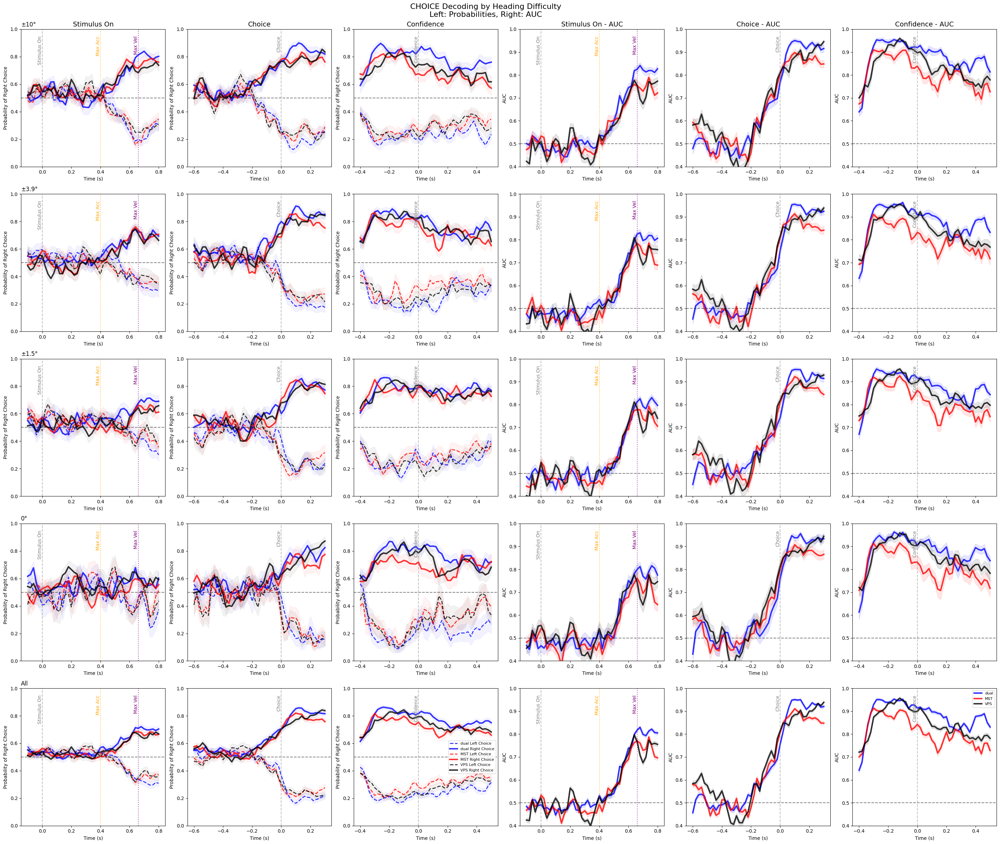


############################################################
PROCESSING TARGET: PDW - BY HEADING DIFFICULTY
############################################################

==================== STIMON ====================

dual:
  20250602: Loaded session data successfully
  20250602: ±10° trials: 1104
  20250602: ±3.9° trials: 1104
  20250602: ±1.5° trials: 1104
  20250602: 0° trials: 552
  20250602: All trials: 3864
  20250702: Loaded session data successfully
  20250702: ±10° trials: 1012
  20250702: ±3.9° trials: 1012
  20250702: ±1.5° trials: 1012
  20250702: 0° trials: 644
  20250702: All trials: 3680
  20250710: Loaded session data successfully
  20250710: ±10° trials: 874
  20250710: ±3.9° trials: 828
  20250710: ±1.5° trials: 966
  20250710: 0° trials: 460
  20250710: All trials: 3128
  20250523: Loaded session data successfully
  20250523: ±10° trials: 1104
  20250523: ±3.9° trials: 1104
  20250523: ±1.5° trials: 1104
  20250523: 0° trials: 552
  20250523: All trials: 3864
  To

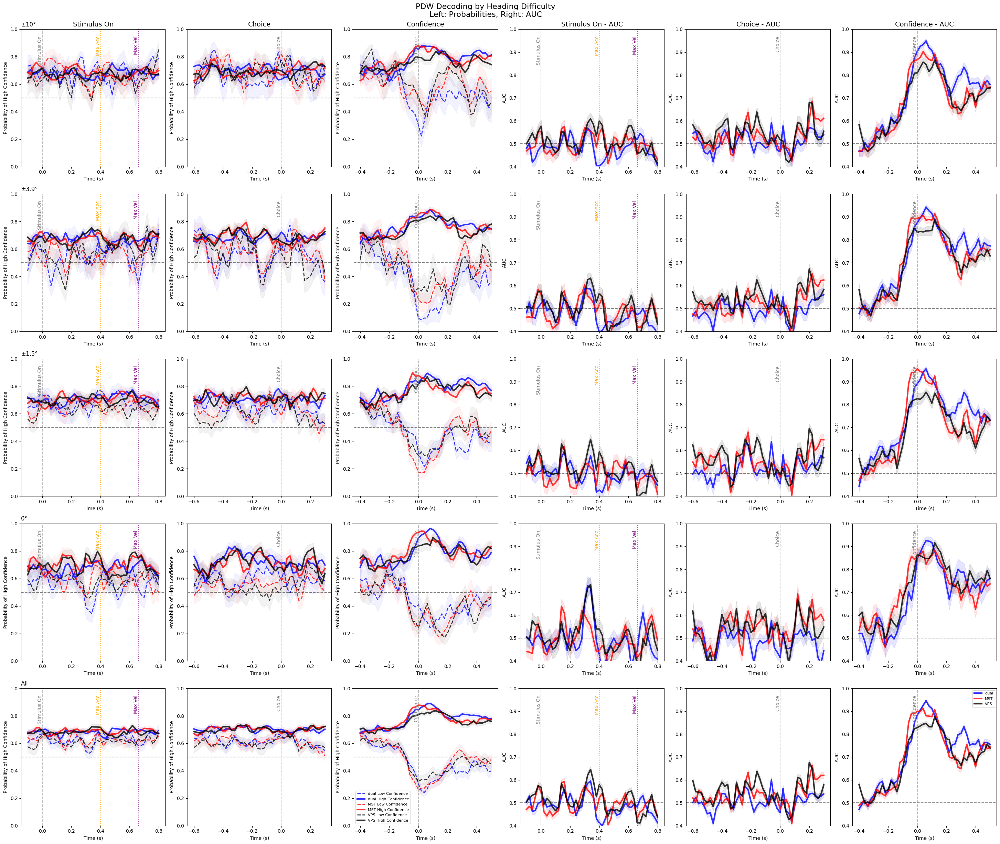


############################################################
PROCESSING TARGET: STIMULUS - BY HEADING DIFFICULTY
############################################################
Skipping 0° heading for stimulus target

==================== STIMON ====================

dual:
  20250602: Loaded session data successfully
  20250602: ±10° trials: 1104
  20250602: ±3.9° trials: 1104
  20250602: ±1.5° trials: 1104
  20250602: All trials: 3312
  20250702: Loaded session data successfully
  20250702: ±10° trials: 1012
  20250702: ±3.9° trials: 1012
  20250702: ±1.5° trials: 1012
  20250702: All trials: 3036
  20250710: Loaded session data successfully
  20250710: ±10° trials: 1104
  20250710: ±3.9° trials: 1104
  20250710: ±1.5° trials: 1104
  20250710: All trials: 3312
  20250523: Loaded session data successfully
  20250523: ±10° trials: 1104
  20250523: ±3.9° trials: 1104
  20250523: ±1.5° trials: 1104
  20250523: All trials: 3312
  Total ±10° trials: 4324
  Total ±3.9° trials: 4324
  Total ±1.

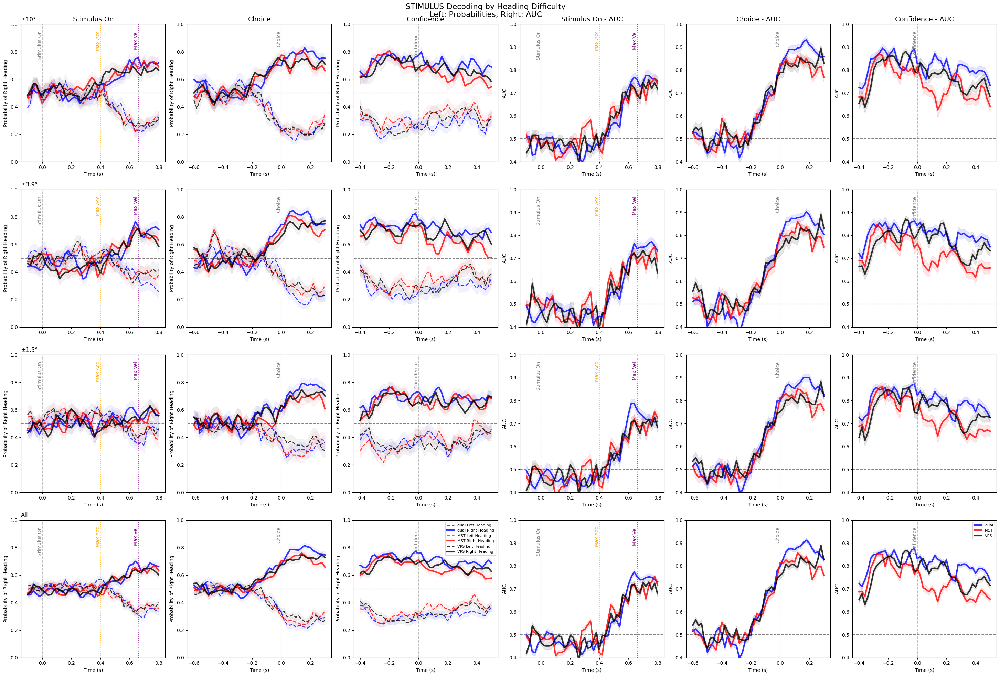

In [24]:
# Define brain areas, alignments, and targets
areas = ['dual', 'MST', 'VPS']
alignments = ['stimOn', 'saccOnset', 'postTargHold']
targets = ['choice', 'PDW', 'stimulus']
area_colors = {'dual': 'blue', 'MST': 'red', 'VPS': 'black'}
subject = "zarya"
date = "20250602"
data_dict = load_session_data(subject, date)

# Alignment display names
alignment_names = {
    'stimOn': 'Stimulus On',
    'saccOnset': 'Choice', 
    'postTargHold': 'Confidence'
}

# Define heading groups
heading_groups = {
    '±10°': [1, 7],    # Most extreme headings
    '±3.9°': [2, 6],     # Medium-high headings  
    '±1.5°': [3, 5],   # Medium-low headings
    '0°': [4],         # Zero heading (ambiguous)
    'All': [1, 2, 3, 4, 5, 6, 7]  # All headings combined
}

# Velocity profile markers for stimOn alignment
vel_markers = {
    'max_velocity': 0.66,
    'max_acceleration': 0.4,
}
dates = ["20250602", "20250702", "20250710", "20250523"]   

# Function to create file path
def get_filepath(date, area, alignment, target):
    return f"D:\\Neural-Pipeline\\results\\analysis_population\\decoders\\zarya_{date}_{area}_{target}_{alignment}_train_mod3_coh2_test_mod3_coh2_cv_results.npy"

# Process each target separately
for target in targets:
    print(f"\n{'#'*60}")
    print(f"PROCESSING TARGET: {target.upper()} - BY HEADING DIFFICULTY")
    print(f"{'#'*60}")
    
    # Skip 0° heading for stimulus target
    current_heading_groups = heading_groups.copy()
    if target == 'stimulus':
        current_heading_groups = {k: v for k, v in heading_groups.items() if k != '0°'}
        print("Skipping 0° heading for stimulus target")
    
    # Create figure with subplots (rows x 6 columns: heading groups x (3 prob + 3 AUC))
    n_rows = len(current_heading_groups)
    fig, axes = plt.subplots(n_rows, 6, figsize=(30, 5*n_rows))
    
    # Handle single row case
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    
    all_stats = {}
    
    for j, alignment in enumerate(alignments):
        print(f"\n{'='*20} {alignment.upper()} {'='*20}")
        
        alignment_stats = {}
        
        # Initialize time_axes
        time_axes = None
        
        for area in areas:
            color = area_colors[area]
            
            # Collect trials for all heading groups
            all_trials_by_group = {}
            for group_name, heading_indices in current_heading_groups.items():
                all_trials_by_group[group_name] = []
            
            print(f"\n{area}:")
            successful_dates = 0
            
            for date in dates:
                # Load session data for this specific date
                try:
                            
                    if time_axes is None:
                        time_axes = time_axes_dots3DMP[alignment]
                    
                    print(f"  {date}: Loaded session data successfully")
                except Exception as e:
                    print(f"  {date}: Failed to load session data - {str(e)}")
                    continue
                
                filepath = get_filepath(date, area, alignment, target)
                
                try:
                    # Load decoder results
                    results = np.load(filepath, allow_pickle=True).item()
                    trial_results = results['trial_results']
                    
                    # Filter trials by heading difficulty using the stored behavioral data
                    for trial in trial_results:
                        # Check if trial has the new format with behavioral data
                        if 'test_behavior' in trial:
                            # NEW FORMAT: Extract heading info directly from trial results
                            headings = trial['test_behavior']['headingInd']
                            
                            # Create separate trial entries for each test trial
                            for i, heading in enumerate(headings):
                                # Create a single-trial entry
                                single_trial = {
                                    'time': trial['time'],
                                    'cv_fold': trial['cv_fold'],
                                    'y_proba': trial['y_proba'][i:i+1],  # Single prediction
                                    'y_pred': trial['y_pred'][i:i+1],
                                    'y_test': trial['y_test'][i:i+1],
                                    'auc': trial['auc'],  # Keep overall AUC
                                    'accuracy': trial['accuracy'],  # Keep overall accuracy
                                    # Store all behavioral info for this specific trial
                                    'heading': heading,
                                    'choice': trial['test_behavior']['choice'][i],
                                    'PDW': trial['test_behavior']['PDW'][i],
                                    'modality': trial['test_behavior']['modality'][i],
                                    'coherenceInd': trial['test_behavior']['coherenceInd'][i],
                                    'correct': trial['test_behavior']['correct'][i],
                                    'oneTargConf': trial['test_behavior']['oneTargConf'][i],
                                    'RT': trial['test_behavior']['RT'][i],
                                }
                                
                                # Add trial to appropriate groups
                                for group_name, heading_indices in current_heading_groups.items():
                                    if heading in heading_indices:
                                        all_trials_by_group[group_name].append(single_trial)
                        
                        else:
                            # OLD FORMAT: Skip or handle differently
                            print(f"  Warning: Old format detected for {date}, skipping...")
                            continue
                    
                    successful_dates += 1
                    
                    # Print trial counts for each group
                    for group_name in current_heading_groups.keys():
                        group_count = len([t for t in trial_results if 'test_behavior' in t 
                                         for h in t['test_behavior']['headingInd'] 
                                         if h in current_heading_groups[group_name]])
                        print(f"  {date}: {group_name} trials: {group_count}")
                    
                except FileNotFoundError:
                    print(f"  {date}: File not found - {filepath}")
                    continue
                except Exception as e:
                    print(f"  {date}: Error - {str(e)}")
                    continue
            
            if successful_dates == 0:
                print(f"  No data found for {area}")
                continue
            
            # Print total trial counts
            for group_name, trials in all_trials_by_group.items():
                print(f"  Total {group_name} trials: {len(trials)}")
            
            # Set ylabel once per area (will be used for both panels)
            if target == 'choice':
                ylabel = 'Probability of Right Choice'
            elif target == 'stimulus':
                ylabel = 'Probability of Right Heading'
            elif target == 'PDW':
                ylabel = 'Probability of High Confidence'
            
            # Process each heading group (each row)
            for i, (group_name, trials) in enumerate(all_trials_by_group.items()):
                if trials:
                    time_points = sorted(list(set([trial['time'] for trial in trials])))
                    
                    class_0_proba = []
                    class_0_std = []
                    class_1_proba = []
                    class_1_std = []
                    pooled_mean_auc = []
                    pooled_std_auc = []
                    
                    for t in time_points:
                        time_trials = [trial for trial in trials if trial['time'] == t]
                        
                        if time_trials:
                            class_0_probabilities = []
                            class_1_probabilities = []
                            
                            for trial in time_trials:
                                y_test = trial['y_test'][0]  # Single value now
                                y_proba = trial['y_proba'][0]  # Single value now
                                
                                if y_test == 0:
                                    class_0_probabilities.append(y_proba)
                                elif y_test == 1:
                                    class_1_probabilities.append(y_proba)
                            
                            # Calculate statistics
                            if class_0_probabilities:
                                class_0_proba.append(np.mean(class_0_probabilities))
                                class_0_std.append(np.std(class_0_probabilities) / np.sqrt(len(class_0_probabilities)))
                            else:
                                class_0_proba.append(np.nan)
                                class_0_std.append(0)
                            
                            if class_1_probabilities:
                                class_1_proba.append(np.mean(class_1_probabilities))
                                class_1_std.append(np.std(class_1_probabilities) / np.sqrt(len(class_1_probabilities)))
                            else:
                                class_1_proba.append(np.nan)
                                class_1_std.append(0)
                            
                            # AUC calculation
                            time_aucs = [trial['auc'] for trial in time_trials]
                            pooled_mean_auc.append(np.mean(time_aucs))
                            pooled_std_auc.append(np.std(time_aucs) / np.sqrt(len(time_aucs)))
                        else:
                            class_0_proba.append(np.nan)
                            class_0_std.append(0)
                            class_1_proba.append(np.nan)
                            class_1_std.append(0)
                            pooled_mean_auc.append(0.5)
                            pooled_std_auc.append(0)
                    
                    # Match lengths with proper time axes
                    if time_axes is not None and len(time_axes) != len(class_0_proba):
                        if len(time_axes) > len(class_0_proba):
                            time_axes_group = time_axes[:len(class_0_proba)]
                            print(f"  Warning: Truncating time axis from {len(time_axes)} to {len(class_0_proba)} points")
                        else:
                            time_axes_group = np.linspace(time_axes[0], time_axes[-1], len(class_0_proba))
                            print(f"  Warning: Interpolating time axis from {len(time_axes)} to {len(class_0_proba)} points")
                    elif time_axes is not None:
                        time_axes_group = time_axes
                    else:
                        # Fallback if no time_axes loaded
                        time_axes_group = np.arange(len(class_0_proba))
                        print(f"  Warning: Using default time axes for {area}")
                    
                    # Plot Probability (left panel: columns 0, 1, 2)
                    ax_prob = axes[i, j]
                    
                    # Set target-specific labels
                    if target == 'choice':
                        class_0_label = f'{area} Left Choice'
                        class_1_label = f'{area} Right Choice'
                    elif target == 'stimulus':
                        class_0_label = f'{area} Left Heading'
                        class_1_label = f'{area} Right Heading'
                    elif target == 'PDW':
                        class_0_label = f'{area} Low Confidence'
                        class_1_label = f'{area} High Confidence'
                    
                    # Plot class 0 probabilities
                    ax_prob.plot(time_axes_group, class_0_proba, color=color, linestyle='--', 
                               linewidth=2, label=class_0_label, alpha=0.8)
                    ax_prob.fill_between(time_axes_group, 
                                       np.array(class_0_proba) - np.array(class_0_std),
                                       np.array(class_0_proba) + np.array(class_0_std),
                                       alpha=0.05, color=color)
                    
                    # Plot class 1 probabilities
                    ax_prob.plot(time_axes_group, class_1_proba, color=color, linestyle='-', 
                               linewidth=3, label=class_1_label, alpha=0.8)
                    ax_prob.fill_between(time_axes_group, 
                                       np.array(class_1_proba) - np.array(class_1_std),
                                       np.array(class_1_proba) + np.array(class_1_std),
                                       alpha=0.05, color=color)
                    
                    # Plot AUC (right panel: columns 3, 4, 5)
                    ax_auc = axes[i, j + 3]
                    ax_auc.plot(time_axes_group, pooled_mean_auc, color=color, linestyle='-', 
                              linewidth=3, label=f'{area}', alpha=0.8)
                    ax_auc.fill_between(time_axes_group, 
                                       np.array(pooled_mean_auc) - np.array(pooled_std_auc),
                                       np.array(pooled_mean_auc) + np.array(pooled_std_auc),
                                       alpha=0.1, color=color)
        
        # Format all subplots for this alignment (column j for prob, j+3 for AUC)
        for i, group_name in enumerate(current_heading_groups.keys()):
            # Format Probability subplot
            ax_prob = axes[i, j]
            ax_prob.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_prob.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            # Add velocity markers for stimOn alignment with text annotations
            if alignment == 'stimOn':
                ax_prob.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_prob.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                
                # Add text annotations at the top of the plot
                ax_prob.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=10, transform=ax_prob.get_xaxis_transform())
                ax_prob.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=10, transform=ax_prob.get_xaxis_transform())
            
            # Add text annotation for alignment line with proper alignment name
            ax_prob.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='gray', fontsize=10,
                       transform=ax_prob.get_xaxis_transform())
            
            ax_prob.set_xlabel('Time (s)')
            ax_prob.set_ylabel(ylabel)
            
            # Add title for first column only
            if j == 0:
                ax_prob.set_title(f'{group_name}', fontsize=12, loc='left')
            
            # Add column title for first row only
            if i == 0:
                ax_prob.set_title(f'{alignment_names[alignment]}', fontsize=14)
            
            # Only show legend on the last probability subplot (bottom right of prob panels)
            if i == len(current_heading_groups) - 1 and j == len(alignments) - 1:
                ax_prob.legend(fontsize=8)
            
            ax_prob.set_ylim(0.0, 1.0)
            
            # Format AUC subplot
            ax_auc = axes[i, j + 3]
            ax_auc.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_auc.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            # Add velocity markers for stimOn alignment with text annotations
            if alignment == 'stimOn':
                ax_auc.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_auc.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                
                # Add text annotations at the top of the plot
                ax_auc.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=10, transform=ax_auc.get_xaxis_transform())
                ax_auc.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=10, transform=ax_auc.get_xaxis_transform())
            
            # Add text annotation for alignment line with proper alignment name
            ax_auc.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='gray', fontsize=10,
                       transform=ax_auc.get_xaxis_transform())
            
            ax_auc.set_xlabel('Time (s)')
            ax_auc.set_ylabel('AUC')
            
            # Add titles for AUC panels
            if i == 0:  # First row only
                ax_auc.set_title(f'{alignment_names[alignment]} - AUC', fontsize=14)
            
            # Only show legend on the last AUC subplot (bottom right of AUC panels)
            if i == len(current_heading_groups) - 1 and j == len(alignments) - 1:
                ax_auc.legend(fontsize=8)
            
            ax_auc.set_ylim(0.4, 1.0)
    
    # Add overall title
    fig.suptitle(f'{target.upper()} Decoding by Heading Difficulty\nLeft: Probabilities, Right: AUC', 
                 fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.05)
    
    # Save the figure
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\compare_area_{target}_zarya_probability_all_headings_with_auc.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

### Archive

In [ ]:
## Recording Info

# 20250501
depth_ranges = [
    (0, 900),          # below MST
    (1000, 3080),      # MST
    (3900, 6460)     # VPS
]

depth_labels = [
    "0–900 μm (below MST)",
    "1000–3080 μm (MST)",
    "3900–6460 μm (VPS)"
]

# 20250306
# depth_ranges = [
#     (0, 1300),          # below MST
#     (1300, 3180),      # MST
#     (3900, 7460),     # VPS
#     (7660, np.max(depth)) # above VPS
# ]

# depth_labels = [
#     "0–1300 μm (below MST)",
#     "1300–3180 μm (MST)",
#     "3900–7460 μm (VPS)"
# #     "7660 - μm (above VPS)"
# ]


In [ ]:
def log_decoder(X, y, time_info, valid_trials, valid_cluster, dualratio=1, 
                event_info=None, target_name=None,
                valid_cluster_2=None, n_shuffles=0,
                align_event=0, num_units=50, n_splits=10, 
                num_repeats=5, return_coef=False):

    # Time info
    center_start = time_info["center_start"][align_event]
    center_stop = time_info["center_stop"][align_event]
    bin_size = time_info["bin_size"]
    time_axis = np.arange(center_start, center_stop + bin_size, bin_size) * 1000  # in ms

    # Update labels based on event_info and target_name if provided
    if event_info is not None and target_name is not None:
        target_idx = event_info["name"].index(target_name)
        class_1 = event_info["class_1"][target_idx]
        class_2 = event_info["class_2"][target_idx]

        # Ensure class_1 and class_2 are iterable
        if class_1 is not None and class_2 is not None:
            if not isinstance(class_1, (list, tuple)):
                class_1 = [class_1]
            if not isinstance(class_2, (list, tuple)):
                class_2 = [class_2]
            y = np.array([0 if v in class_1 else 1 if v in class_2 else np.nan for v in y])
        else:
            raise ValueError(f"target, {target_name} must have both class_1 and class_2 defined in event_info")
    
    if dualratio == 1:
        if num_units == 0:
            num_units = len(valid_cluster)
            num_repeats = 1

    all_mean_scores = []
    all_std_scores = []
    shuffle_scores_all = []

    clf = LogisticRegression(penalty='l1', C = 10, solver='liblinear', max_iter=3000)
#     clf = SVC(kernel='rbf', C=1, probability=True) 
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # No condition masking, just select valid trials
    selected_trials = ~np.isnan(y).flatten() & valid_trials.flatten()
    X_clean = X[0, 0][selected_trials]
    y_clean = y[selected_trials].flatten()
    
    X_clean = np.array(X_clean)

    invalid_idx = []

    for i in range(X_clean.shape[0]): 
        for j in range(X_clean.shape[1]):  
            try:
                if np.isnan(X_clean[i, j][0][0]):
                    invalid_idx.append(i)
                    break
            except IndexError:
                print(f"IndexError at X_sub[{i}, {j}] — skipping")
            except TypeError:
                print(f"TypeError at X_sub[{i}, {j}] — not array-like")

    invalid_idx = np.array(invalid_idx, dtype=int)
    valid_mask = np.ones(X_clean.shape[0], dtype=bool)
    valid_mask[invalid_idx] = False
    if not valid_mask.all():
        X_clean = X_clean[valid_mask, :]         
        y_clean = y_clean[valid_mask]       

    num_events, num_units_total = X_clean.shape
    num_time_points = X_clean[0, 0][0].shape[0]
    

    for rep in range(num_repeats):
        if len(valid_cluster) < num_units:
            raise ValueError(f"Not enough valid units ({len(valid_cluster)}) to sample {num_units}")

        if num_units == 0:
            selected_units = valid_cluster
        else:
            if valid_cluster_2 is not None:
                unit_A = round(num_units * dualratio)
                unit_B = num_units - unit_A

                if len(valid_cluster) < unit_A:
                    raise ValueError(f"Not enough units in valid_cluster to sample {unit_A}")
                if len(valid_cluster_2) < unit_B:
                    raise ValueError(f"Not enough units in valid_cluster_2 to sample {unit_B}")

                selected_units_A = np.random.choice(valid_cluster, size=unit_A, replace=False)
                selected_units_B = np.random.choice(valid_cluster_2, size=unit_B, replace=False)
                selected_units = np.concatenate([selected_units_A, selected_units_B])
            else:
                if len(valid_cluster) < num_units:
                    raise ValueError(f"Not enough units in valid_cluster to sample {num_units}")
                selected_units = np.random.choice(valid_cluster, size=num_units, replace=False) 
                
        X_sub = np.array(X_clean[:, selected_units])
        
        mean_scores = []
        std_scores = []
        shuffle_scores = []

        for t in range(num_time_points):
            X_input = [[X_sub[i, j][0][t] for j in range(num_units)] for i in range(len(X_sub))]
#             scaler = StandardScaler()         
#             X_input = scaler.fit_transform(X_input)
            
            y_input = y_clean
            scores = cross_val_score(clf, X_input, y_input, cv=skf)
            mean_scores.append(scores.mean())
            std_scores.append(scores.std())
            
            # Null decoding by shuffling labels
            if n_shuffles > 0:
                shuf_scores = []
                for _ in range(n_shuffles):
                    y_shuffled = np.random.permutation(y_input)
                    null_score = cross_val_score(clf, X_input, y_shuffled, cv=skf).mean()
                    shuf_scores.append(null_score)
                shuffle_scores.append(shuf_scores)

        all_mean_scores.append(mean_scores)
        all_std_scores.append(std_scores)
        if n_shuffles > 0:
            shuffle_scores_all.append(shuffle_scores)

    mean_scores_avg = np.mean(all_mean_scores, axis=0)
    sem_scores = np.std(all_mean_scores, axis=0) / np.sqrt(len(all_mean_scores))
    if n_shuffles > 0:
        shuffle_scores_all = np.array(shuffle_scores_all)
        null_mean = shuffle_scores_all.mean(axis=(0, 2)) 
    

    if n_shuffles > 0:
        return mean_scores_avg, sem_scores, time_axis, null_mean
    else:
        return mean_scores_avg, sem_scores, time_axis


In [ ]:
# Plot the decoder accuracy for the across area
# with PdfPages("20250501_dots3DMP_dualaccuracyplot.pdf") as pdf:

class_unit = responsive_units
for d, target_name, y, color in zip(
    [0, 1],
    ["choice", "headingInd"],
    [choice.copy(), headingInd.copy()],
    ["royalblue", "salmon"]
    ):

    for idx, (depth_min, depth_max) in enumerate(depth_ranges):

        if idx !=1:
            continue
            
        

        plt.figure(figsize=(15, 10))

        for modcoh in range(5):
            mod = mods[modcoh]
            coh = cohs[modcoh]
            valid_trials = (modality == mod) & (coherence == coh) # & np.isin(headingInd, [1, 7])
            valid_scores = class_unit[(mod - 1),:].reshape(-1,1)
            threshold = np.quantile(valid_scores, 0.30)

            valid_depth = (depth >= depth_min) & (depth <= depth_max) & (valid_scores <= threshold)
            valid_cluster = cluster_id[np.where(valid_depth)]

            valid_depth2 = (depth >= depth_ranges[idx+1][0]) & (depth <= depth_ranges[idx+1][1]) & (valid_scores <= threshold)
            valid_cluster_2 = cluster_id[valid_depth2]
            
            print(f"Total valid units under {mod_names[modcoh]}: {len(valid_cluster)}, {len(valid_cluster_2)}")
            print(f"Total trial for {mod_names[modcoh]}: {np.sum(valid_trials)}")

            for i in range(3):  
                X = spkrates[i].copy()

                ax = plt.subplot(5, 3, modcoh * 3 + i + 1)

                for ratio, ratio_color, area_name in zip(
                    [0, 0.5,1],
                    ["royalblue","gray", "salmon"],
                    ["VPS", "50:50", "MST"]
                    ):

                    mean_scores, sem_scores, time_axis = log_decoder(X, y, time_info, 
                        valid_trials, valid_cluster, valid_cluster_2 = valid_cluster_2,
                        dualratio = ratio, event_info=event_info, target_name=target_name,
                        align_event=i, num_units=30, n_splits=8, num_repeats=5)


                    ax.plot(time_axis[:len(mean_scores)], mean_scores, label=area_name, 
                            color=ratio_color)
                    ax.fill_between(
                        time_axis[:len(mean_scores)],
                        np.array(mean_scores) - np.array(sem_scores),
                        np.array(mean_scores) + np.array(sem_scores),
                        color=ratio_color, alpha=0.2
                    )

                ax.axvline(0, color='black', linestyle='--', linewidth=1.5)
                ax.set_ylim(0.4, 1)
                ax.set_xlim(time_axis[0], time_axis[-1])

                if modcoh == 0:
                    ax.set_title(event_names[i])
                if modcoh == 4:
                    ax.set_xlabel("Time (ms)")
                if i == 0:
                    ax.set_ylabel(f"{mod_names[modcoh]}\nAccuracy")

                # Only add legend to the last plot of the top row (to avoid clutter)
                if modcoh == 0 and i == 0:
                    ax.legend(loc="upper left", fontsize=8)

        plt.suptitle(f"Decoding Accuracy for {target_name} — Dual Area", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
#         pdf.savefig()
#         plt.close()
        plt.show()


In [ ]:
def lin_decoder(X, y, time_info, valid_trials, valid_cluster, heading_angles, dualratio=1, 
                valid_cluster2 = None, align_event=0, num_units=50, n_splits=10,
                 num_repeats=5, shuffle=False, random_state=42):

    # Time info
    center_start = time_info["center_start"][align_event]
    center_stop = time_info["center_stop"][align_event]
    bin_size = time_info["bin_size"]
    time_axis = np.arange(center_start, center_stop + bin_size, bin_size) * 1000  # in ms

    # Valid trial and cluster selection
    selected_trials = ~np.isnan(y).flatten() & valid_trials.flatten()
    X_clean = X[0,0][selected_trials]
    y_clean = y[selected_trials].astype(int)
    
    
    if shuffle:
        rng = np.random.default_rng(random_state)
        y_clean = rng.permutation(y_clean)

    y_clean = heading_angles[y_clean] 
    y_clean = np.sin(np.deg2rad(y_clean))


    num_events, num_units_total = X_clean.shape

    num_time_points = X_clean[0, 0][0].shape[0]
    

    if num_units == 0:
        num_units = len(valid_cluster)
        num_repeats = 1

    all_r2_scores = []
    all_mse_scores = []

    model = Lasso(alpha=0.05)
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    for rep in range(num_repeats):
        # Random unit selection
        if len(valid_cluster) < num_units:
            raise ValueError(f"Not enough valid units ({len(valid_cluster)}) to sample {num_units}")

        if num_repeats == 1:
            selected_units = valid_cluster
        else:
            selected_cluster = np.random.choice(len(valid_cluster), size=num_units, replace=False)
            selected_units = valid_cluster[selected_cluster]

        X_sub = X_clean[:, selected_units]

        r2_scores = []
        mse_scores = []

        for t in range(num_time_points):
            X_input = np.array([[X_sub[i, j][0][t] for j in range(num_units)] for i in range(len(X_sub))])
            y_input = y_clean

            fold_r2 = []
            fold_mse = []

            for train_idx, test_idx in kf.split(X_input):
                X_train, X_test = X_input[train_idx], X_input[test_idx]
                y_train, y_test = y_input[train_idx], y_input[test_idx]

                model.fit(X_train, y_train)
                y_pred = model.predict(X_test)

                fold_r2.append(r2_score(y_test, y_pred))
                fold_mse.append(mean_squared_error(y_test, y_pred))

            r2_scores.append(np.mean(fold_r2))
            mse_scores.append(np.mean(fold_mse))

        all_r2_scores.append(r2_scores)
        all_mse_scores.append(mse_scores)

    # Aggregate results
    mean_r2 = np.mean(all_r2_scores, axis=0)
    sem_r2 = np.std(all_r2_scores, axis=0) / np.sqrt(num_repeats)

    mean_mse = np.mean(all_mse_scores, axis=0)
    sem_mse = np.std(all_mse_scores, axis=0) / np.sqrt(num_repeats)

    return mean_mse, sem_mse, time_axis